<img src="http://imgur.com/1ZcRyrc.png" style="float: left; margin: 20px; height: 55px">
 
# Decision Trees

*Originally adapted from Chapter 8 of [An Introduction to Statistical Learning](http://www-bcf.usc.edu/~gareth/ISL/)*

---

## Learning Objectives

Students will be able to:

- Explain how a decision tree is created.
- Build a decision tree model in scikit-learn.
- Tune a decision tree model and explain how tuning impacts the model.
- Interpret a tree diagram.
- Describe the key differences between regression and classification trees.
- Decide whether or not a decision tree is an appropriate model for a given problem.

## Class Overview

- Review
- Decision Trees in Context
- Intuition Behind Decisions Trees
- How a Decision Trees is Built
- Splitting Criteria
- Types of Decision Trees
- Decision Tree Metrics
- Examples
- Business Example

# I. Decisions Trees in Context

Where are we so far?

![Obama-Clinton decision tree](assets/overview.png)

### Which Problem Types Have We Covered So Far?

- For supervised continuous we have linear regression
- For supervised categorical we have KNN and logistic regression


###### Today we are going to cover decision trees which can both continuous and catergorical supervised problems!

# II. Intuition

###### Business Problem:

Seperate email that is spam from those that are not spam.


Imagine that you had to decide what spam email was from non spam email.

What are some criteria that could make email spam or not?

- The person that sent the email
- The length of the email
- Number of times that the word free appears
- etc.




###### Image of Tree


If you have enough of these criteria, then you can just make a list to help seperate them.

Have rules so that you can have someone else do it.

But once you have these rules then you can automate them.

This automation is the idea behind the decision tree.


Each Question is turned into a binary decision that splits into two categories

Then when we want to get an answer we can then traverse the tree.

We also want the most predictive question first so that we can save time with calculations.

Imagine if we chose the least predictive first.

## Quick Notation

![Obama-Clinton decision tree](assets/decision_tree_notation.png)

- Root Node: The top node in a tree.
- Leaf/External Node: A node with no children.
- Internal Nodde: A node with at least one child.

# III. How It's Constructed

There are 3 main components in building a decision tree:

- a. ID3 Algorithm
- b. Splitting Criteria
- c. Stopping Criteria

### a. ID3 (Iterative Dichotomiser 3) Algorithm

##### ID3 Steps:

- Calculate the split metric of every features of the data set.
- Partition ("split") the set S into subsets using the attribute for which the resulting split metric after splitting is minimized; or, equivalently, information gain is maximum
- Make a decision tree node containing that attribute.
- Recur on subsets using remaining attributes.


##### Spam Example

- Go through each features in the spam data set (# of times free, length)
- Calculate the the splitting criteria for each partition (split the data on 3 times they mention free, then try other values)
- Make a node based on the one with the "best" criteria (3 times free is mentioned)
- Repeat on the remaining features (length of mail, sender, etc)

![Obama-Clinton decision tree](assets/ID3_algorithm_decision_tree.png)

## b. Split Criteria


Splitting criteria depends on whether we are building a regression or categorical tree <br>
There more explanatory our higher nodes are the more efficient our tree will be

#### 1. Categarical Splitting Criteria



#### A. **Entropy** 

Also known as _Shannon's Entropy_, described by Claude Shannon in his 1948 paper "A Mathematical Theory of Communication".  


### $$ \text{Entropy} = -\sum_{i=1}^{classes} p(i\;|\;t) \;log_2( p(i\;|\;t) ) $$


We can use $entropy$ to help us determine which is the best criteria split for our data, using it's output we can calculate **"information gain"**.

- Non-negative 
- Entropy will be close to 0 when class balance close to 0 (ie: %98 Class 1 / %2 Class2 or vice-versa)
- When multiple classes are not close to 0, entropy will be larger
- Tends to be used for categorical attributes


**Information gain** calculates the expected reduction in entropy due to the sorting on the feature.


### $$ \text{Information Gain(i)} = \ Entropy(target) - Entropy(target, i)\ $$

__IG closer to 1 is desirable, higher Information Gain is better__.


In [140]:
def entropy(class_probabilities):
    # The sum of: inverse class probability 
    # scaled by probability of log base 2
    return np.sum(
        -class_p * np.log2(class_p) 
        for class_p in class_probabilities
            if class_p # no zero probabilities
    )

#### B. Gini

**Gini** on the other hand is a bit older and comes to us from Italian statistician _Corrado Gini_, and was first published in his 1912 paper Variability and Mutability.  **Gini** is a metric describing dispersion and originally used to represent wealth distribution of a nation's residents, and is "the most commonly used measurement of inequality".

### $$ \text{Gini} = 1 - \sum_{i=1}^{classes} p(i\;|\;t)^2 $$

We use $Gini$ criterion to measure the "purity" of a split.  
Weighed $Gini$ for each split is used to calculate **Gini Impurity**. 

- Non-negative
- Ranges from 0 to .5
- Closer to .5 with equal splits
- Not as sensitive as Entropy
- More efficient to calculate than log2
- Tends to be used for continious attributes

We would look at the example how to numerically solve for Gini at the end of the lecture. 
Idea is to find Gini index for every attribute. 
__Smaller Gini index is better__.

In [146]:
def gini(p):
    
    zero_conditions = (
        (p[0] == 0 and p[1] == 0),
        (p[0] == 1 and p[1] == 0),
        (p[0] == 0 and p[1] == 1),
    )
    
    if any(zero_conditions):
        return 0
    
    return 1 - np.sum(
        class_p**2
        for class_p in p
            if class_p # ignore zero probabilities
    )

##### Spam Example

- Go through each features in the spam data set (# of times free, length)
- Calculate the information gain for each partition (split the data on 3 times they mention free, then try other values)
- Make a node based on the one with the highest information gain (5 times free is mentioned)
- Repeat on the remaining features (length of mail, sender, etc)

#### 2. Regression Splitting Criteria

a. **Root mean squared error (RMSE)** 

The square root of the mean of the squared errors:

$$\sqrt{\frac 1n\sum_{i=1}^n(y_i-\hat{y}_i)^2}$$

##### Housing Example

- Go through each features in the housing data set (# of rooms, sqft, distance to school)
- Calculate the RMSE (root mean squared error) for each split of features by comparing the mean values of the leaf nodes to the predicted values
- Make a node based on the split & feature with the lowest RMSE (3 rooms)
- Repeat on the remaining features (sqft, distance from school)

## c. Stopping Criteria


One of the dangers of decision trees is that they can create a leaf node for each point in the data set.
They have high variability since they don't make assumptions about the data so they tend to overfit.

To avoid this we can limit the number of partitions we do by:

- deciding how many partitions we make
- Or how the minimum number of data points for leaf nodes

###### Example of a Tree Being Constructed

It uses an ID3 algorithm:

- Calculate the entropy of every attribute a of the data set S.
- Partition ("split") the set S into subsets using the attribute for which the resulting entropy after splitting is minimized; or, equivalently, information gain is maximum
- Make a decision tree node containing that attribute.
- Recur on subsets using remaining attributes.
- Stop when the minimun number of data in a leaf node is met


This is a **greedy algorithm** because it makes locally optimal decisions -- it takes the best split at each step. A greedy algorithm hopes that a series of locally optimal decisions might be optimal overall; however, this is not always the case. For example:

- Always eating cookies to maximize your immediate happiness (greedy) might not lead to optimal overall happiness.

- In our case, reorganizing parts of the tree already constructed based on future splits might result in a better model overall. 

This is done using a recursive function

# C. Tree Types & Applications

1. Classification
2. Regression

<a id="comparing-trees"></a>
## Comparing Classification Trees and Regression Trees (CART)

|Regression Trees|Classification Trees|
|---|---|
|Predict a continuous response.|Predict a categorical response.|
|Predict using mean response of each leaf.|Predict using most commonly occurring class of each leaf.|
|Splits are chosen to minimize MSE.|Splits are chosen to minimize Gini index (discussed below).|

# 1. Classification

### Popular Example

![Obama-Clinton decision tree](assets/obama_clinton_tree.jpg)

# The split method is information gain or gini coefficient

# IDF for classification:
It uses an ID3 algorithm:

- Calculate the entropy/gini of every attribute a of the data set S.
- Partition ("split") the set S into subsets using the attribute for which the resulting entropy/gini after splitting is minimized; or, equivalently, information gain is maximum
- Make a decision tree node containing that attribute.
- Recur on subsets using remaining attributes.


## Splitting Data

In [55]:
import seaborn as sns

iris = sns.load_dataset('iris')
iris['if_setosa'] = [1 if i == 'setosa' else 0 for i in iris.species] 

In [56]:
# Entropy

In [93]:
from scipy.stats import entropy

def entropy1(labels, base=None):
    value,counts = np.unique(labels, return_counts=True)
    return entropy(counts, base=base)

In [94]:
# Define a function that calculates the RMSE for a given split of bmi.
def length_split(length):
    lower = iris[iris.petal_length < length].if_setosa
    higher = iris[iris.petal_length >= length].if_setosa
    #expense['prediction'] = np.where(expense.bmi < bmi, lower_bmi, higher_bmi)
    return entropy1(higher) + entropy1(lower)

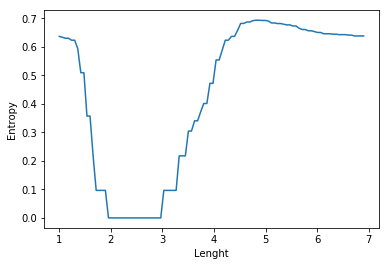

In [95]:
length_range = np.linspace(min(iris.petal_length), max(iris.petal_length), 100)
entropies = [length_split(item) for item in length_range]   

# Plot mileage cutpoint (x-axis) versus RMSE (y-axis).
plt.plot(sorted(length_range), entropies);
plt.xlabel('Lenght');
plt.ylabel('Entropy');

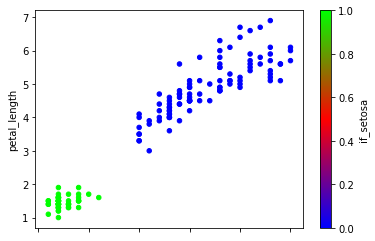

In [96]:
iris.plot(kind='scatter', x='petal_width', y='petal_length', c='if_setosa', colormap='brg')

Inputs:
- Can be dummy variables or continuous data
- Out put is categarical


Paramaters:
- Criterion
- Depth
- Leaves

# Example:

In [97]:
import seaborn as sns

iris = sns.load_dataset('iris')
iris['if_setosa'] = [1 if i == 'setosa' else 0 for i in iris.species] 

In [102]:
y = iris.if_setosa

X = iris[['sepal_length','sepal_width','petal_length','petal_width']]

In [124]:
from sklearn import tree
from sklearn.model_selection import train_test_split
from sklearn import metrics
import collections


X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=99)

clf = tree.DecisionTreeClassifier()
clf = clf.fit(X_train, y_train)

In [127]:
predictions = clf.predict(X_test)

metrics.accuracy_score(predictions, y_test)

1.0

# Visual

# 2. Regression

<a id="part-one"></a>

Decision trees can also predict numerical data. Instead of returning a class, we will return a single numeric value for each set of conditions.

For example, the following tree predicts Major League Baseball salaries based on Years playing in the major leagues and Hits the previous year. Only three different salaries are ever predicted (the average salaries of players that meet each set of conditions): 

![Salary tree](assets/salary_tree.png)

The salary has been divided by 1,000 and log-normalized, for example a salary of \$166,000 refers to the number:

$$5.11 = \ln(\$166000/1000)$$

Similarly, 6.00 is \$403,000, and 6.74 is \$846,000. A natural log transform was made because some salaries are much higher than others, leading to a non-ideal long-tail distribution.

![Salary tree annotated](assets/salary_tree_annotated.png)

**What does this tree tell you about your data?**

- Years is the most important factor determining salary, with a lower number of years corresponding to a lower salary.
- For a player with a lower number of years, hits is not an important factor in determining salary.
- For a player with a higher number of years, hits is an important factor in determining salary, with a greater number of hits corresponding to a higher salary.


<a id="computer-build"></a>
## How Does a Computer Build a Regression Tree?

**Ideal approach:** Considering every possible partition of the feature space (computationally infeasible).

**"Good enough" approach:** Recursive binary splitting.

1. Begin at the top of the tree.
2. For **every feature**, examine **every possible cutpoint**, and choose the feature and cutpoint so that the resulting tree has the lowest possible mean squared error (MSE). Make that split.
3. Examine the two resulting regions. Once again, make a **single split** (in one of the regions) to minimize the MSE.
4. Keep repeating Step 3 until a **stopping criterion** is met:
    - Maximum tree depth (maximum number of splits required to arrive at a leaf).
    - Minimum number of observations in a leaf.

# Example:

In [28]:
import pandas as pd
import matplotlib.pyplot as plt
import os
from sklearn import metrics
import numpy as np

# allow plots to appear in the notebook
%matplotlib inline
plt.rcParams['figure.figsize'] = (6, 4)
plt.rcParams['font.size'] = 14

# Read the data
data_path = './data/insurance-med-expenses.csv'
expense = pd.read_csv(data_path)

# Use the .rename() method to rename columns
expense.rename(columns={'expenses': 'med_expense'}, inplace=True)

print(expense.describe())

               age          bmi        sport     children   med_expense
count  1338.000000  1338.000000  1338.000000  1338.000000   1338.000000
mean     39.207025    30.665471     1.409567     1.094918  13270.422414
std      14.049960     6.098382     1.009883     1.205493  12110.011240
min      18.000000    16.000000     0.000000     0.000000   1121.870000
25%      27.000000    26.300000     1.000000     0.000000   4740.287500
50%      39.000000    30.400000     1.000000     1.000000   9382.030000
75%      51.000000    34.700000     2.000000     2.000000  16639.915000
max      64.000000    53.100000     3.000000     5.000000  63770.430000


In [29]:
# Before splitting anything, just predict the mean of the entire data set.
expense['prediction'] = expense.med_expense.mean()
display(expense.head(3))

,age,sex,bmi,sport,children,smoker,region,med_expense,prediction
0,19,female,27.9,3,0,yes,southwest,16884.92,13270.422414
1,18,male,33.8,3,1,no,southeast,1725.55,13270.422414
2,28,male,33.0,2,3,no,southeast,4449.46,13270.422414


In [30]:
# Calculate RMSE for those predictions.
np.sqrt(metrics.mean_squared_error(expense.med_expense, expense.prediction))

12105.484978572953

In [31]:
# Define a function that calculates the RMSE for a given split of bmi.
def bmi_split(bmi):
    lower_bmi = expense[expense.bmi < bmi].med_expense.mean()
    higher_bmi = expense[expense.bmi >= bmi].med_expense.mean()
    expense['prediction'] = np.where(expense.bmi < bmi, lower_bmi, higher_bmi)
    return np.sqrt(metrics.mean_squared_error(expense.med_expense, expense.prediction))

In [32]:
# Calculate RMSE for tree that splits on bmi < 20. 
# Note: change cell to get a correct output of RMSE: 12083.316825244912
print('RMSE:',     )

# Calculate RMSE for tree that splits on bmi < 30.
# Note: change cell to get a correct output of RMSE: 11862.060199457495
print('RMSE:',     )

RMSE:
RMSE:


In [33]:
# Solution:
# Calculate RMSE for tree that splits on bmi < 20. 
print('RMSE:', bmi_split(20))
display(expense.head())

RMSE: 12083.316825244912


,age,sex,bmi,sport,children,smoker,region,med_expense,prediction
0,19,female,27.9,3,0,yes,southwest,16884.92,13390.436922
1,18,male,33.8,3,1,no,southeast,1725.55,13390.436922
2,28,male,33.0,2,3,no,southeast,4449.46,13390.436922
3,33,male,22.7,2,0,no,northwest,21984.47,13390.436922
4,32,male,28.9,2,0,no,northwest,3866.86,13390.436922


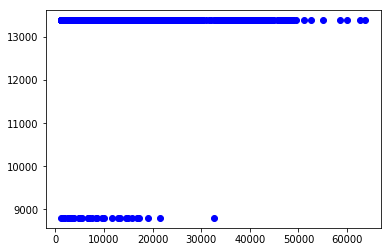

In [34]:
plt.plot(expense.med_expense, expense.prediction, 'bo')

In [35]:
# Calculate RMSE for tree that splits on bmi < 30.
print('RMSE:', bmi_split(30))
display(expense.head())

RMSE: 11862.060199457495


,age,sex,bmi,sport,children,smoker,region,med_expense,prediction
0,19,female,27.9,3,0,yes,southwest,16884.92,10713.666926
1,18,male,33.8,3,1,no,southeast,1725.55,15552.335728
2,28,male,33.0,2,3,no,southeast,4449.46,15552.335728
3,33,male,22.7,2,0,no,northwest,21984.47,10713.666926
4,32,male,28.9,2,0,no,northwest,3866.86,10713.666926


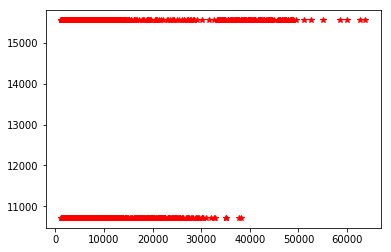

In [36]:
plt.plot(expense.med_expense, expense.prediction, 'r*')

In [37]:
expense.prediction.unique()

array([10713.66692552, 15552.33572843])

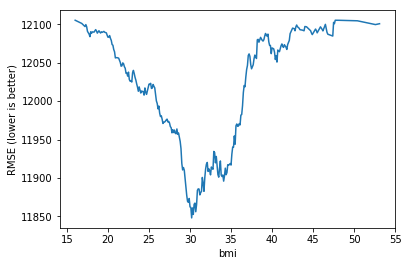

In [39]:
# Check all possible bmi splits.
bmi_range = list(expense.bmi)
RMSE = [bmi_split(item) for item in sorted(bmi_range)]   

# Plot mileage cutpoint (x-axis) versus RMSE (y-axis).
plt.plot(sorted(bmi_range), RMSE);
plt.xlabel('bmi');
plt.ylabel('RMSE (lower is better)');

In [136]:
# Decision tree representation
(expense['bmi'] > 30).value_counts()

True     698
False    640
Name: bmi, dtype: int64

This is an example of how a decision tree split works, if you were doing a decision based on a RMSE.   

### Visual

### Analyzing the Performance of the Model

Categorization

- Accuracy
- F1 Score
- AUC Score

In [12]:
# Depends on what you want
# Past performance

In [13]:
# Example We will do Together
# Using Decision Tree and Example

### Business Case

In [ ]:
# Can you Predict X?

In [14]:
## Optimize X
# Change different parameters
# Choose different features
# Choose different models


In [139]:
# Sneak Peak:
# Ensembling Trees

<a id="introduction"></a>
# Introduction

In this lesson, we will be exploring **decision trees** and **random forests**. These are non-parametric supervised learning models that can either be used for regression or classification. 

You are likely very familiar with decision trees already! For example, take this graphic from the New York Times. It explains how to predict whether Barack Obama or Hillary Clinton will win the Democratic primary in a particular county in 2008. At the same time, it informs which features might be most important to predict an Obama or Clinton win:

![Obama-Clinton decision tree](assets/obama_clinton_tree.jpg)


**Random forests** are groups of decision trees created using different subsets and feature sets of the training data. Each tree "votes" on a classification.

### Why are we learning about decision trees?

- They can be applied to both regression and classification problems.
- They are easy to explain to others (interpretable).
- They are very popular among data scientists.
- They are the basis for more sophisticated models.
- They have a different way of "thinking" than the other models we have studied.

<a id="part-one"></a>
# Part 1: Regression Trees

In this section, we will make decision trees that predict numeric data. Instead of returning a class, we will return a single numeric value for each set of conditions.

For example, the following tree predicts Major League Baseball salaries based on Years playing in the major leagues and Hits the previous year. Only three different salaries are ever predicted (the average salaries of players that meet each set of conditions): 

![Salary tree](assets/salary_tree.png)

The salary has been divided by 1,000 and log-normalized, for example a salary of \$166,000 refers to the number:

$$5.11 = \ln(\$166000/1000)$$

Similarly, 6.00 is \$403,000, and 6.74 is \$846,000. A natural log transform was made because some salaries are much higher than others, leading to a non-ideal long-tail distribution.


Our dataset will be Major League Baseball player data from 1986–87:

- **Years** (x-axis): Number of years playing in the major leagues.
- **Hits** (y-axis): Number of hits in the previous year.
- **Salary** (color): Low salary is blue/green, high salary is red/yellow.

![Salary data](assets/salary_color.png)

<a id="group-exercise"></a>
### Group Exercise

- The data set above is our **training data**.
- We want to build a model that predicts the salary of **future players** based on years and hits.
- We are going to "segment" the feature space into regions, and then use the **mean salary in each region** as the predicted Salary for future players.
- Intuitively, you want to **maximize** the similarity (or "homogeneity") within a given region, and **minimize** the similarity between different regions.

#### Rules for Segmenting

- You can only use **straight lines** that are drawn one at a time.
- Your line must either be **vertical or horizontal**.
- Your line **stops** when it hits an existing line.

---

**Solution (only look AFTER the group exercise!):** [Salary regions](./assets/salary_regions.png)

As shown in the solution above, the regions created by a computer are:

- $R_1$: Players with **less than 5 years** of experience and a mean salary of **\$166,000**.
- $R_2$: Players with **5 or more years** of experience and **less than 118 hits** and mean salary of **\$403,000**.
- $R_3$: Players with **5 or more years** of experience and **118 hits or more** and mean Salary of **\$846,000**.

**Note:** Years and hits are both integers, but the convention is to use the **midpoint** between adjacent values to label a split.

These regions are used to make predictions for **out-of-sample data**. Thus, there are only three possible predictions! (Is this different from how **linear regression** makes predictions?)

Below is the equivalent regression tree:

![Salary tree](assets/salary_tree.png)

The first split is **years < 4.5**, thus that split goes at the top of the tree. When a splitting rule is **true**, you follow the left branch. When a splitting rule is **false**, you follow the right branch.

For players in the **left branch**, the mean salary is \$166,000, thus you label it with that value. (Salary has been divided by 1,000 and log-transformed to 5.11.)

For players in the **right branch**, there is a further split on **hits < 117.5**, dividing players into two more salary regions: \$403,000 (transformed to 6.00), and \$846,000 (transformed to 6.74).

![Salary tree annotated](assets/salary_tree_annotated.png)

**What does this tree tell you about your data?**

- Years is the most important factor determining salary, with a lower number of years corresponding to a lower salary.
- For a player with a lower number of years, hits is not an important factor in determining salary.
- For a player with a higher number of years, hits is an important factor in determining salary, with a greater number of hits corresponding to a higher salary.

**Question:** What do you like and dislike about decision trees so far?

<a id="computer-build"></a>
## How Does a Computer Build a Regression Tree?

**Ideal approach:** Considering every possible partition of the feature space (computationally infeasible).

**"Good enough" approach:** Recursive binary splitting.

1. Begin at the top of the tree.
2. For **every feature**, examine **every possible cutpoint**, and choose the feature and cutpoint so that the resulting tree has the lowest possible mean squared error (MSE). Make that split.
3. Examine the two resulting regions. Once again, make a **single split** (in one of the regions) to minimize the MSE.
4. Keep repeating Step 3 until a **stopping criterion** is met:
    - Maximum tree depth (maximum number of splits required to arrive at a leaf).
    - Minimum number of observations in a leaf.

---

This is a **greedy algorithm** because it makes locally optimal decisions -- it takes the best split at each step. A greedy algorithm hopes that a series of locally optimal decisions might be optimal overall; however, this is not always the case. For example:

- Always eating cookies to maximize your immediate happiness (greedy) might not lead to optimal overall happiness.

- In our case, reorganizing parts of the tree already constructed based on future splits might result in a better model overall. 

<a id="cutpoint-demo"></a>
## Insurance Medical Expenses Dataset
### Demo: Choosing the Ideal Cutpoint for a Given Feature

In [107]:
import pandas as pd
import matplotlib.pyplot as plt
import os
from sklearn import metrics
import numpy as np

# allow plots to appear in the notebook
%matplotlib inline
plt.rcParams['figure.figsize'] = (6, 4)
plt.rcParams['font.size'] = 14

# Read the data
data_path = './data/insurance-med-expenses.csv'
expense = pd.read_csv(data_path)

# Use the .rename() method to rename columns
expense.rename(columns={'expenses': 'med_expense'}, inplace=True)

print(expense.describe())

               age          bmi        sport     children   med_expense
count  1338.000000  1338.000000  1338.000000  1338.000000   1338.000000
mean     39.207025    30.665471     1.409567     1.094918  13270.422414
std      14.049960     6.098382     1.009883     1.205493  12110.011240
min      18.000000    16.000000     0.000000     0.000000   1121.870000
25%      27.000000    26.300000     1.000000     0.000000   4740.287500
50%      39.000000    30.400000     1.000000     1.000000   9382.030000
75%      51.000000    34.700000     2.000000     2.000000  16639.915000
max      64.000000    53.100000     3.000000     5.000000  63770.430000


In [108]:
# Before splitting anything, just predict the mean of the entire data set.
expense['prediction'] = expense.med_expense.mean()
display(expense.head(3))

,age,sex,bmi,sport,children,smoker,region,med_expense,prediction
0,19,female,27.9,3,0,yes,southwest,16884.92,13270.422414
1,18,male,33.8,3,1,no,southeast,1725.55,13270.422414
2,28,male,33.0,2,3,no,southeast,4449.46,13270.422414


In [109]:
# Calculate RMSE for those predictions.
np.sqrt(metrics.mean_squared_error(expense.med_expense, expense.prediction))

12105.484978572953

In [110]:
# Define a function that calculates the RMSE for a given split of bmi.
def bmi_split(bmi):
    lower_bmi = expense[expense.bmi < bmi].med_expense.mean()
    higher_bmi = expense[expense.bmi >= bmi].med_expense.mean()
    expense['prediction'] = np.where(expense.bmi < bmi, lower_bmi, higher_bmi)
    return np.sqrt(metrics.mean_squared_error(expense.med_expense, expense.prediction))

In [64]:
# Calculate RMSE for tree that splits on bmi < 20. 
# Note: change cell to get a correct output of RMSE: 12083.316825244912
print('RMSE:',     )

# Calculate RMSE for tree that splits on bmi < 30.
# Note: change cell to get a correct output of RMSE: 11862.060199457495
print('RMSE:',     )

RMSE:
RMSE:


In [111]:
# Solution:
# Calculate RMSE for tree that splits on bmi < 20. 
print('RMSE:', bmi_split(20))
display(expense.head())

RMSE: 12083.316825244912


,age,sex,bmi,sport,children,smoker,region,med_expense,prediction
0,19,female,27.9,3,0,yes,southwest,16884.92,13390.436922
1,18,male,33.8,3,1,no,southeast,1725.55,13390.436922
2,28,male,33.0,2,3,no,southeast,4449.46,13390.436922
3,33,male,22.7,2,0,no,northwest,21984.47,13390.436922
4,32,male,28.9,2,0,no,northwest,3866.86,13390.436922


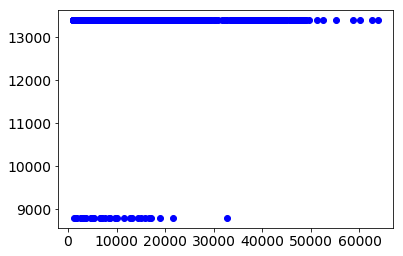

In [66]:
plt.plot(expense.med_expense, expense.prediction, 'bo')

In [112]:
# Calculate RMSE for tree that splits on bmi < 30.
print('RMSE:', bmi_split(30))
display(expense.head())

RMSE: 11862.060199457495


,age,sex,bmi,sport,children,smoker,region,med_expense,prediction
0,19,female,27.9,3,0,yes,southwest,16884.92,10713.666926
1,18,male,33.8,3,1,no,southeast,1725.55,15552.335728
2,28,male,33.0,2,3,no,southeast,4449.46,15552.335728
3,33,male,22.7,2,0,no,northwest,21984.47,10713.666926
4,32,male,28.9,2,0,no,northwest,3866.86,10713.666926


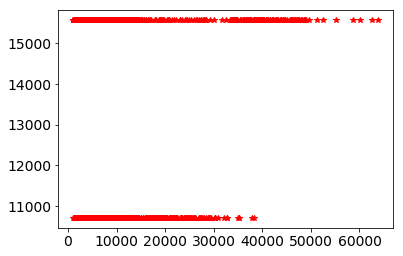

In [113]:
plt.plot(expense.med_expense, expense.prediction, 'r*')

In [114]:
expense.prediction.unique()

array([10713.66692552, 15552.33572843])

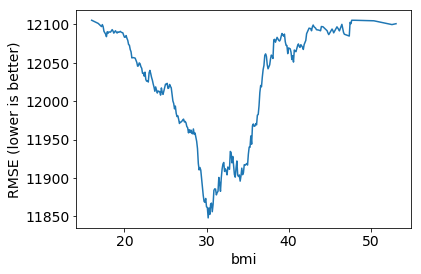

In [115]:
# Check all possible bmi splits.
bmi_range = list(expense.bmi)
RMSE = [bmi_split(item) for item in sorted(bmi_range)]   

# Plot mileage cutpoint (x-axis) versus RMSE (y-axis).
plt.plot(sorted(bmi_range), RMSE);
plt.xlabel('bmi');
plt.ylabel('RMSE (lower is better)');

**Recap:** Before every split, we repeat this process for __every feature__ and choose the feature and cutpoint that produce the lowest MSE.

In [71]:
# Decision tree representation
(expense['bmi'] > 30).value_counts()

True     698
False    640
Name: bmi, dtype: int64

This is an example of how a decision tree split works, if you were doing a decision based on a RMSE.   

CART trees, which is the most common algorithm for trees, use a following measures for splitting trees: Gini & Entropy

To understand the core concepts behind decision tree classifiers we need to learn:
- How class balance relates to **Gini** and **Entropy**
- The concept of **Information Gain**
- How decision trees use information gain to make decisions

<a id="science-behind"></a>
### Science behind Decision Tree Algorithm

The goal of a decision tree is to differentiate sections of a dataset (a partition) that easily unmix the classes contained within them, through a series of conditional splits. A partition is considered to be pure once all data of a specific class exists in it. How data is partioned (ie: split), depends on the conditions that qualifies how it is partitioned. Each time data is partitioned conditionally, it can be partitioned again until all data of a specific class is contained in the terminating partition (leaf node).

We use __gini__ or __entropy__ to measure this idea of "purity" within a partion. Another way to think about purity is how "unbalanced" the proportion of classes are. The more unbalanced a set classes are within a given partition, the more pure the partition is.

The learning algorithm considers all possible conditions for the best possible split, given the amount of __information gain__.
Multiple conditions are considered, however, the condition that is selected has the best information gain. Generally, information gain can be described as a metric that considers the potential splits from a condition that provide the lowest amount of bias overall.

Through an iterative process of testing potential splits for any given aspect of our decision tree, we first need to consider how to measure a partitions' purity. Since our partitions will exist as a result of a conditional split, we can measure the resulting proportion of classes that ends up in our partitions for purity. Our decision tree's goal is to split our data in ways that unmix our obsevations as much as possible. The idea of having the most homogenous subsets, based on conditional splits, are optimal for estimation.



<a id="quality-measurements"></a>
### Measuring the quality of split
There are two great metrics for this that are commonly used: Entropy and Gini

> **Entropy** is also known as _Shannon's Entropy_, described by Claude Shannon in his 1948 paper "A Mathematical Theory of Communication".  
**Gini** on the other hand is a bit older and comes to us from Italian statistician _Corrado Gini_, and was first published in his 1912 paper Variability and Mutability.  **Gini** is a metric describing dispersion and originally used to represent wealth distribution of a nation's residents, and is "the most commonly used measurement of inequality".


### $$ \text{Entropy} = -\sum_{i=1}^{classes} p(i\;|\;t) \;log_2( p(i\;|\;t) ) $$

We can use $entropy$ to help us determine which is the best criteria split for our data, using it's output we can calculate **"information gain"**.

- Non-negative 
- Entropy will be close to 0 when class balance close to 0 (ie: %98 Class 1 / %2 Class2 or vice-versa)
- When multiple classes are not close to 0, entropy will be larger
- Tends to be used for categorical attributes


**Information gain** calculates the expected reduction in entropy due to the sorting on the feature.

### $$ \text{Information Gain(i)} = \ Entropy(target) - Entropy(target, i)\ $$

__IG closer to 1 is desirable, higher Information Gain is better__.

In [19]:
def entropy(class_probabilities):
    # The sum of: inverse class probability 
    # scaled by probability of log base 2
    return np.sum(
        -class_p * np.log2(class_p) 
        for class_p in class_probabilities
            if class_p # no zero probabilities
    )

### $$ \text{Gini} = 1 - \sum_{i=1}^{classes} p(i\;|\;t)^2 $$

We use $Gini$ criterion to measure the "purity" of a split.  
Weighed $Gini$ for each split is used to calculate **Gini Impurity**. 

- Non-negative
- Ranges from 0 to .5
- Closer to .5 with equal splits
- Not as sensitive as Entropy
- More efficient to calculate than log2
- Tends to be used for continious attributes

We would look at the example how to numerically solve for Gini at the end of the lecture. 
Idea is to find Gini index for every attribute. 
__Smaller Gini index is better__.

In [73]:
def gini(p):
    
    zero_conditions = (
        (p[0] == 0 and p[1] == 0),
        (p[0] == 1 and p[1] == 0),
        (p[0] == 0 and p[1] == 1),
    )
    
    if any(zero_conditions):
        return 0
    
    return 1 - np.sum(
        class_p**2
        for class_p in p
            if class_p # ignore zero probabilities
    )

<a id="sklearn-tree"></a>
## Building a Regression Tree in `scikit-learn`

In [74]:
# Clean the dataset by dropping the column "prediction" we created previously
expense.drop(['prediction'], axis=1, inplace=True)

# Create dummy variables using get_dummies from Pandas.
expense_dummies = pd.get_dummies(expense[['sex','smoker','region']])

# Concatenate the original DataFrame and the dummy DataFrame (axis=0 means rows, axis=1 means columns).
expense_dummies = pd.concat([expense, expense_dummies], axis=1)

In [75]:
expense_dummies.head(5)

,age,sex,bmi,sport,children,smoker,region,med_expense,sex_female,sex_male,smoker_no,smoker_yes,region_northeast,region_northwest,region_southeast,region_southwest
0,19,female,27.9,3,0,yes,southwest,16884.92,1,0,0,1,0,0,0,1
1,18,male,33.8,3,1,no,southeast,1725.55,0,1,1,0,0,0,1,0
2,28,male,33.0,2,3,no,southeast,4449.46,0,1,1,0,0,0,1,0
3,33,male,22.7,2,0,no,northwest,21984.47,0,1,1,0,0,1,0,0
4,32,male,28.9,2,0,no,northwest,3866.86,0,1,1,0,0,1,0,0


In [76]:
# Produce list of all numeric features
num_feats = ['age','bmi','children','med_expense']
# Produce dummy variables for using all categorical features
cat_feats = ['sex','smoker','region']
# non_cat_feats = [f for f in expense.columns if f not in cat_feats]
# expense_dummies = pd.get_dummies(expense[cat_feats])

remove_feats = []
for feat in cat_feats:
    # ascending order, where the first element is the most frequently occuring category
    dummy_to_remove = expense[feat].value_counts(ascending=True).index[0]
    # finding names of the features around dummy variables that represent
    # categories with the smallest number of observations
    for dummy_feat in expense_dummies.columns:
        if dummy_feat.endswith(dummy_to_remove):
            remove_feats.append(dummy_feat)

expense_dummies.drop(remove_feats + cat_feats, axis=1, inplace=True)
expense_dummies.head()

,age,bmi,sport,children,med_expense,sex_male,smoker_no,region_northwest,region_southeast,region_southwest
0,19,27.9,3,0,16884.92,0,0,0,0,1
1,18,33.8,3,1,1725.55,1,1,0,1,0
2,28,33.0,2,3,4449.46,1,1,0,1,0
3,33,22.7,2,0,21984.47,1,1,1,0,0
4,32,28.9,2,0,3866.86,1,1,1,0,0


In [77]:
from sklearn.model_selection import cross_val_score, train_test_split

# Define X and y. Include all variables except for variables 
# that we've encoded and the dependent variable.
feature_cols = [x for x in expense_dummies.columns.values 
                if x != 'med_expense']

X = expense_dummies[feature_cols]
y = expense_dummies.med_expense
X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=123)

In [78]:
from sklearn.tree import DecisionTreeRegressor

# Instantiate a DecisionTreeRegressor (with random_state=1).
treereg = DecisionTreeRegressor(random_state=1)
treereg

DecisionTreeRegressor(criterion='mse', max_depth=None, max_features=None,
           max_leaf_nodes=None, min_impurity_decrease=0.0,
           min_impurity_split=None, min_samples_leaf=1,
           min_samples_split=2, min_weight_fraction_leaf=0.0,
           presort=False, random_state=1, splitter='best')

<a id="cross-validation"></a>
### K-folds Cross Validation

 __Leave-one-out cross-validation (LOOCV)__ is a method for validating the model. It's inefficient with the large datasets since it uses the number of folds equal to number of row in data, meaning that it runs the model for extra N-1 times. 
For large datasets we would normally use a much smaller number of folds, in order to make it less computationally intensive this is called __K-folds CV__; 

Rule of thumb: use K = 3 to K = 15  

Basic approach of K-folds Cross Validation:

- Randomly divide the set of observations into K groups, or folds of approximately equal size
    - the K-th fold is treated as a validation set
    - the remaining K-1 fold make up the training set
- Repeat K times 

Resulting K estimates of the test error 

 \begin{equation*}
\left( \ CV_K = \frac{1}{K} \sum_{k=1}^K MSE_k \right) \
\end{equation*}
        


A model is trained using k-1 of the folds as training data;
the resulting model is validated on the remaining part of the data (i.e., it is used as a test set to compute a performance measure such as accuracy).
The performance measure reported by k-fold cross-validation is then the average of the values computed in the loop. This approach can be __computationally expensive__, but does not waste too much data (as it is the case when fixing an arbitrary test set), which is a major advantage in problems where the number of samples is very small.

In [79]:
# Performing LOOCV cross validation to estimate the RMSE for this model.
# CV is number of folds in cross validation
treereg = DecisionTreeRegressor(random_state=1)
scores = cross_val_score(treereg, X_train, y_train, cv=X_train.shape[0], 
                         scoring='neg_mean_squared_error')
np.mean(np.sqrt(-scores))

3370.4785543369894

In [80]:
X_train.shape[0]

1003

In [81]:
scores.shape

(1003,)

<a id="too-deep"></a>
## What Happens When We Grow a Tree Too Deep?

- **On the left:** A regression tree for salary that is **grown deeper**.
- **On the right:** A comparison of the **training, testing, and cross-validation errors** for trees with different numbers of leaves.

![Salary tree grown deep](assets/salary_tree_deep.png)

The **training error** continues to go down as the tree size increases (due to overfitting), but the lowest **cross-validation error** occurs for a tree with three leaves. 

Note that if we make a **complete tree** (where every data point is boxed into its own region), then we will achieve perfect training accuracy. However, then outliers in the training data will greatly affect the model.

<a id="#tuning-tree"></a>
## Tuning a Regression Tree

Let's try to reduce overfitting by tuning the **max_depth** parameter.  
We evaluate RMSE for different tree depths to determine an optimal depth.

In [82]:
# Try max_depth=1
treereg = DecisionTreeRegressor(max_depth=1, random_state=1)
scores = cross_val_score(treereg, X_train, y_train, cv=10, scoring='neg_mean_squared_error')
np.mean(np.sqrt(-scores))

7547.0349081207005

Or, we could write a loop to try a range of values:

In [83]:
# List of values to try:
max_depth_range = list(range(1, 8))

# List to store the average RMSE for each value of max_depth:
RMSE_scores = []

# Use LOOCV with each value of max_depth.
for depth in max_depth_range:
    treereg = DecisionTreeRegressor(max_depth=depth, random_state=1)
    scores = cross_val_score(treereg, X_train, y_train, cv=X_train.shape[0],
                             scoring='neg_mean_squared_error')
    RMSE_scores.append(np.mean(np.sqrt(-scores)))

We can see that using LOOCV for different tree depths takes time. That's why we avoid it with larger datasets.  

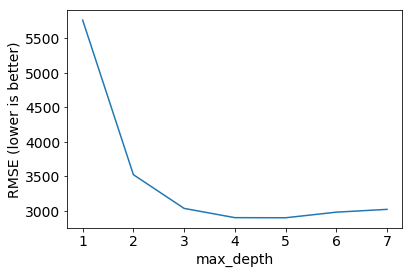

In [84]:
# Plot max_depth (x-axis) versus RMSE (y-axis).
plt.plot(max_depth_range, RMSE_scores);
plt.xlabel('max_depth');
plt.ylabel('RMSE (lower is better)');

max_depth=4 gives a lowest RMSE, so we fit a tree using that parameter

In [85]:
treereg = DecisionTreeRegressor(max_depth=4, random_state=1)
scores = cross_val_score(treereg, X_train, y_train, cv=20, 
                         scoring='neg_mean_squared_error')
np.mean(np.sqrt(-scores))

4780.31527276782

Changing cross-validation to K-fold with K=20 substantially increases the error compared to LOOCV. We do not expect the error to change this much. What could be the issue?    

Some models adapt to data really well, so training them on almost all of the data could still result in a poor model even when using LOOCV. In practice, it is important to separate a **validation** dataset representative of something that you are trying to predict, in order to use it for testing your resulting model. In sklearn documentation refers to a validation dataset as X_test, y_test. We will be using the same names to follow this convention. We would not be using this data to train the model.   

Let's see why having a good validation dataset is important.  

Run the code below as is, and then try changing **random_state** to 42.   
Selecting different data point for training could change your results. In both cases the model is overfitting, and is likely to fail to generalise well on previously unseen data.

In [86]:
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.02, random_state=1)

scores = cross_val_score(treereg, X_train, y_train, 
                         cv=X_train.shape[0], scoring='neg_mean_squared_error')
print("Average LOOCV score " + str(np.mean(np.sqrt(-scores))))

treereg = DecisionTreeRegressor(max_depth=4, random_state=1)
treereg.fit(X_train, y_train)
y_pred = treereg.predict(X_test)
print("Validation score " +
      str(np.sqrt(metrics.mean_squared_error(y_test, y_pred))))

Average LOOCV score 2718.122874454469
Validation score 4473.790147055167


What else can we do to reduce overfitting?  

In [87]:
# note that we are specifying:
#  - the minimum number of samples required to split an internal node
#  - the minimum number of samples required to be at a leaf node
treereg = DecisionTreeRegressor(max_depth=4, random_state=1,
                                min_samples_split=50, min_samples_leaf=5)

scores = cross_val_score(treereg, X_train, y_train, 
                         cv=X_train.shape[0], scoring='neg_mean_squared_error')
print("Average LOOCV score " + str(np.mean(np.sqrt(-scores))))

treereg.fit(X_train, y_train)
y_pred = treereg.predict(X_test)
print("Validation score " +
      str(np.sqrt(metrics.mean_squared_error(y_test, y_pred))))

Average LOOCV score 2699.53007122422
Validation score 4482.202885375002


In [27]:
treereg.feature_importances_

array([0.1058896 , 0.17052079, 0.00192693, 0.00642942, 0.        ,
       0.71523327, 0.        , 0.        , 0.        ])

In [28]:
# "Gini importance" of each feature: the (normalized) total reduction of error brought by that feature.
pd.DataFrame({'feature':feature_cols, 'importance':treereg.feature_importances_})

,feature,importance
0,age,0.105890
1,bmi,0.170521
2,sport,0.001927
3,children,0.006429
4,sex_male,0.000000
5,smoker_no,0.715233
6,region_northwest,0.000000
7,region_southeast,0.000000
8,region_southwest,0.000000


<a id="#tree-diagram"></a>
### Creating a Tree Diagram

To create a tree diagram, we will use the Graphviz library for displaying graph data structures. 

Surprisingly, every tree is just a graph in disguise! <br> 
A graph is a tree only if there is exactly one vertex with no incoming edge (the root), while all other vertices have exactly one incoming edge (representing its parent).

In [88]:
!conda install -y graphviz python-graphviz

Solving environment: done

# All requested packages already installed.



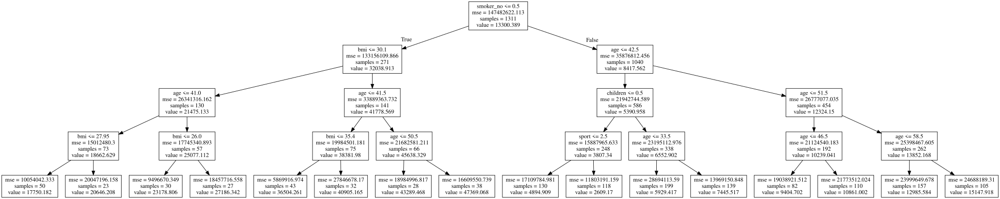

In [89]:
# Create a Graphviz visualisation
import graphviz 
from sklearn.tree import export_graphviz

treereg.fit(X_train, y_train)
dot_data = export_graphviz(treereg, out_file=None, feature_names=feature_cols)

graph = graphviz.Source(dot_data)  
graph 

Reading the internal nodes:

- **samples:** Number of observations in that node before splitting.
- **mse:** MSE calculated by comparing the actual response values in that node against the mean response value in that node.
- **rule:** Rule used to split that node (go left if true, go right if false).

Reading the leaves:

- **samples:** Number of observations in that node.
- **value:** Mean response value in that node.
- **mse:** MSE calculated by comparing the actual response values in that node against "value."

<a id="testing-preds"></a>
## Making Predictions for the Testing Data

In [31]:
display(X_test.head(3))

,age,bmi,sport,children,sex_male,smoker_no,region_northwest,region_southeast,region_southwest
559,19,35.5,3,0,1,1,1,0,0
1087,57,31.5,0,0,1,1,1,0,0
1020,51,37.0,1,0,1,1,0,0,1


**Question:** Using the tree diagram above, what predictions will the model make for each observation?

In [32]:
# Use fitted model to make predictions on testing data.
y_pred = treereg.predict(X_test)

#Display first 20 predictions
y_pred[0:19]

array([ 2609.17008475, 12985.58394904, 10861.002     , 10861.002     ,
        5929.41748744, 36504.26116279, 10861.002     , 12985.58394904,
        4894.90876923, 17750.1824    , 15147.91809524, 12985.58394904,
        7445.51661871,  7445.51661871,  2609.17008475, 10861.002     ,
        4894.90876923,  7445.51661871, 15147.91809524])

In [33]:
# Calculate RMSE
np.sqrt(metrics.mean_squared_error(y_test, y_pred))

4482.202885375002

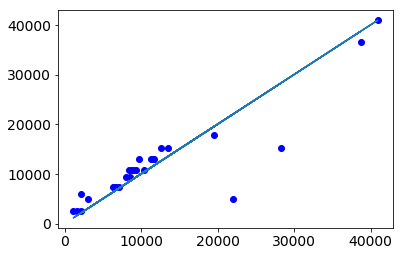

In [92]:
plt.plot(y_test, y_pred, 'bo')
plt.plot(y_test, y_test)


In [93]:
# Calculate RMSE for your own tree.
y_test = [3000, 6000, 12000]
y_pred = [0, 0, 0]

from sklearn import metrics
np.sqrt(metrics.mean_squared_error(y_test, y_pred))

7937.253933193771

In [94]:
treereg.feature_importances_

array([0.1058896 , 0.17052079, 0.00192693, 0.00642942, 0.        ,
       0.71523327, 0.        , 0.        , 0.        ])

<a id="part-two"></a>
# Part 2: Classification Trees

**Example:** Predict whether or not Barack Obama or Hillary Clinton will win the Democratic primary in a particular county in 2008 (from the New York Times).

![Obama-Clinton decision tree](assets/obama_clinton_tree.jpg)

**Questions:**

- What are the observations? How many observations are there?
- What is the response variable?
- What are the features?
- What is the most predictive feature?
- Why does the tree split on high school graduation rate twice in a row?
- What is the class prediction for the following county: 15 percent African American, 90 percent high school graduation rate, located in the South, high poverty, high population density?
- What is the predicted probability for that same county?

<a id="comparing-trees"></a>
## Comparing Classification Trees and Regression Trees (CART)

|Regression Trees|Classification Trees|
|---|---|
|Predict a continuous response.|Predict a categorical response.|
|Predict using mean response of each leaf.|Predict using most commonly occurring class of each leaf.|
|Splits are chosen to minimize MSE.|Splits are chosen to minimize Gini index (discussed below).|

<a id='advantages'></a>
## CART advantages
---

- Simple to understand and interpret. People are able to understand decision tree models after a brief explanation.
    - Useful to work with non technical departments (marketing/sales).
- Requires little data preparation. 
    - Other techniques often require data normalization, dummy variables need to be created and blank values to be removed.
- Able to handle both numerical and categorical data. 
    - Other techniques are usually specialized in analyzing datasets that have only one type of variable.
- Uses a **white box** model.
    - If a given situation is observable in a model the explanation for the condition is easily explained by boolean logic.
    - By contrast, in a **black box** model, the explanation for the results is typically difficult to understand, for example in neural networks.
- Possible to validate a model using statistical tests. That makes it possible to account for the reliability of the model.
- Robust. Performs well even if its assumptions are somewhat violated by the true model from which the data were generated.
- Performs well with large datasets. Large amounts of data can be analyzed using standard computing resources in reasonable time.
- Once trained can be implemented on hardware and has extremely fast execution.
    - Real-time applications like trading, for example.

<a id='disadvantages'></a>
## CART disadvantages
---

- Locally-optimal.
    - Practical decision-tree learning algorithms are based on heuristics such as the greedy algorithm where locally-optimal decisions are made at each node. 
    - Such algorithms cannot guarantee to return the globally-optimal decision tree.
- Overfitting.
    - Decision-tree learners can create over-complex trees that do not generalize well from the training data.
- There are concepts that are hard to learn because decision trees do not express them easily, such as XOR, parity or multiplexer problems. In such cases, the decision tree becomes prohibitively large.
    - Neural networks, for example, are superior for these problems.
- Decision tree learners create biased trees if some classes dominate. It is therefore recommended to balance the dataset prior to fitting with the decision tree.

<a id="splitting-criteria"></a>
## Splitting Criteria for Classification Trees

Common options for the splitting criteria:

- **Classification error rate:** The fraction of training observations in a region that don't belong to the most common class.
- **Gini index:** The measure of total variance across classes in a region.

### Example: Classification Error Rate

Pretend we are predicting whether or not someone will buy an iPhone or an Android:

- At a particular node, there are **25 observations** (phone buyers) of whom **10 bought iPhones and 15 bought Androids**.
- As the majority class is **Android**, that's our prediction for all 25 observations, and thus the classification error rate is **10/25 = 40%**.

Our goal in making splits is to **reduce the classification error rate**. Let's try splitting on gender:

- **Males:** Two iPhones and 12 Androids, thus the predicted class is Android.
- **Females:** Eight iPhones and three Androids, thus the predicted class is iPhone.
- Classification error rate after this split would be **5/25 = 20%**.

Compare that with a split on age:

- **30 or younger:** Four iPhones and eight Androids, thus the predicted class is Android.
- **31 or older:** Six iPhones and seven Androids, thus the predicted class is Android.
- Classification error rate after this split would be **10/25 = 40%**.

The decision tree algorithm will try **every possible split across all features** and choose the one that **reduces the error rate the most.**

### Example: Gini Index

Calculate the Gini index before making a split:

$$1 - \left(\frac {iPhone} {Total}\right)^2 - \left(\frac {Android} {Total}\right)^2 = 1 - \left(\frac {10} {25}\right)^2 - \left(\frac {15} {25}\right)^2 = 0.48$$

- The **maximum value** of the Gini index is 0.5 and occurs when the classes are perfectly balanced in a node.
- The **minimum value** of the Gini index is 0 and occurs when there is only one class represented in a node.
- A node with a lower Gini index is said to be more "pure."

Evaluating the split on **gender** using the Gini index:

$$\text{Males: } 1 - \left(\frac {2} {14}\right)^2 - \left(\frac {12} {14}\right)^2 = 0.24$$
$$\text{Females: } 1 - \left(\frac {8} {11}\right)^2 - \left(\frac {3} {11}\right)^2 = 0.40$$
$$\text{Weighted Average: } 0.24 \left(\frac {14} {25}\right) + 0.40 \left(\frac {11} {25}\right) = 0.31$$

Evaluating the split on **age** using the Gini index:

$$\text{30 or younger: } 1 - \left(\frac {4} {12}\right)^2 - \left(\frac {8} {12}\right)^2 = 0.44$$
$$\text{31 or older: } 1 - \left(\frac {6} {13}\right)^2 - \left(\frac {7} {13}\right)^2 = 0.50$$
$$\text{Weighted Average: } 0.44 \left(\frac {12} {25}\right) + 0.50 \left(\frac {13} {25}\right) = 0.47$$

Again, the decision tree algorithm will try **every possible split** and will choose the one that **reduces the Gini index (and thus increases the "node purity") the most**.

You can think of this as each split increasing the accuracy of predictions. If there is some error at a node, then splitting at that node will result in two nodes with a higher average "node purity" than the original. So, we ensure continually better fits to the training data by continually splitting nodes.

### Comparing Classification Error Rate and Gini Index

- Gini index is generally preferred because it will make splits that **increase node purity**, even if that split does not change the classification error rate.
- Node purity is important because we're interested in the **class proportions** in each region, as that's how we calculate the **predicted probability** of each class.
- scikit-learn's default splitting criteria for classification trees is Gini index.

**Note:** Another common splitting criteria mentioned previously called **cross-entropy**. It's numerically similar to Gini index but slower to compute. So, it's not as popular as Gini index.

<a id="sklearn-ctree"></a>
## Bank-Insurance Dataset
## Building a Classification Tree in `scikit-learn`

We'll build a classification tree using the Bank Insurance data set:

In [97]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import os
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import train_test_split
from sklearn.metrics import roc_curve, auc


path = "data/bank-insurance.csv"
df = pd.read_csv(path)

display(df.head())
df.info()

,age,education,civil-status,occupation,hereditary-cond,ethnic-group,gender,policy-purchase,first name,last name,email
0,39,Bachelor degree,Never-married,Indoor Sedentary,other-family,Australian,Male,0,Christian,Parker,christian.parker@test.com
1,50,Bachelor degree,Married,Qualified Professional,first-degree family,Australian,Male,0,Austin,Carlson,austin.carlson@test.com
2,38,Vocational training,Divorced/Separated,Light Trades,other-family,Australian,Male,0,Ryan,Direnzo,ryan.direnzo@test.com
3,53,Secondary education,Married,Light Trades,first-degree family,Asian,Male,0,Rayfield,Owens,rayfield.owens@test.com
4,28,Bachelor degree,Married,Medical/Dental,first-degree family,Asian,Female,0,Sabrina,Lyles,sabrina.lyles@test.com


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 48842 entries, 0 to 48841
Data columns (total 11 columns):
age                48842 non-null int64
education          48842 non-null object
civil-status       48842 non-null object
occupation         46033 non-null object
hereditary-cond    48842 non-null object
ethnic-group       48842 non-null object
gender             48842 non-null object
policy-purchase    48842 non-null int64
first name         48842 non-null object
last name          48842 non-null object
email              48842 non-null object
dtypes: int64(2), object(9)
memory usage: 4.1+ MB


In [98]:
# We would like to encode our variables, but since names do not provide 
# any information for the classifier, we simply drop them.
# Do you understand why?
df.drop(['first name','last name','email'], inplace=True, axis=1)

non_cat_feats = ['age','policy-purchase']
cat_feats = [col for col in df.columns 
             if col not in non_cat_feats]
# Create a DataFrame of dummy variables
df_dummies = pd.get_dummies(df[cat_feats])

# Concatenate the original DataFrame and the dummy DataFrame.
df_dummies = pd.concat([df[[f for f in df if f not in cat_feats]], 
                        df_dummies], axis=1)
# Print the updated DataFrame.
display(df_dummies.head(3))

,age,policy-purchase,education_Bachelor degree,education_Graduate level,education_Masters degree,education_Other education,education_PHD,education_Secondary education,education_Vocational training,civil-status_Divorced/Separated,...,occupation_Qualified Professional,hereditary-cond_first-degree family,hereditary-cond_no-claims,hereditary-cond_other-family,ethnic-group_Asian,ethnic-group_Australian,ethnic-group_European,ethnic-group_Other,gender_Female,gender_Male
0,39,0,1,0,0,0,0,0,0,0,...,0,0,0,1,0,1,0,0,0,1
1,50,0,1,0,0,0,0,0,0,0,...,1,1,0,0,0,1,0,0,0,1
2,38,0,0,0,0,0,0,0,1,1,...,0,0,0,1,0,1,0,0,0,1


In [99]:
# Removing collinear dummy variables
non_cat_feats = [f for f in df.columns if f not in cat_feats]

remove_feats = []
for feat in cat_feats:
    # ascending order, where the first element is the most frequently occuring category
    dummy_to_remove = df[feat].value_counts(ascending=True).index[0]
    # finding names of the features amound dummy variables that represent
    # categories with the smallest number of observations
    for dummy_feat in df_dummies.columns:
        if dummy_feat.endswith(dummy_to_remove):
            remove_feats.append(dummy_feat)
            
df_dummies.drop(remove_feats, axis=1, inplace=True)
display(df_dummies.head(3))

,age,policy-purchase,education_Bachelor degree,education_Graduate level,education_Masters degree,education_Other education,education_Secondary education,education_Vocational training,civil-status_Divorced/Separated,civil-status_Married,...,occupation_Indoor Sedentary,occupation_Light Trades,occupation_Medical/Dental,occupation_Qualified Professional,hereditary-cond_first-degree family,hereditary-cond_other-family,ethnic-group_Asian,ethnic-group_Australian,ethnic-group_European,gender_Male
0,39,0,1,0,0,0,0,0,0,0,...,1,0,0,0,0,1,0,1,0,1
1,50,0,1,0,0,0,0,0,0,1,...,0,0,0,1,1,0,0,1,0,1
2,38,0,0,0,0,0,0,1,1,0,...,0,1,0,0,0,1,0,1,0,1


In [100]:
# # Define X and y. Include all variables except for variables 
# that we've encoded and the dependent variable.
target_name = 'policy-purchase'
feats = [f for f in df_dummies if f != target_name]
X = df_dummies[feats]
y = df_dummies[target_name]

In [101]:
# Splitting data set to train and test
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25, random_state=125)

In [102]:
# Let’s first fit a decision tree with default parameters to get a baseline idea of the performance
treeclf = DecisionTreeClassifier(random_state=1)

# Use leave-one-out cross-validation (LOOCV) to estimate the RMSE for this model.
cv_scores = cross_val_score(treeclf, X_train, y_train, cv=10, scoring='accuracy')
msg = "Accuracy score: %f (%f)" % (cv_scores.mean(), cv_scores.std())
print(msg)

Accuracy score: 0.801998 (0.006441)


In [103]:
# Compute the feature importances (the Gini index at each node).
treeclf.fit(X_train, y_train)

pd.DataFrame({'feature':feats, 'importance':treeclf.feature_importances_})

,feature,importance
0,age,0.232731
1,education_Bachelor degree,0.037941
2,education_Graduate level,0.007592
3,education_Masters degree,0.022635
4,education_Other education,0.020790
5,education_Secondary education,0.014498
6,education_Vocational training,0.020068
7,civil-status_Divorced/Separated,0.008501
8,civil-status_Married,0.341954
9,civil-status_Never-married,0.009767


In [105]:
#Do a prediction on test data 
y_pred = treeclf.predict(X_test)
y_pred

array([0, 1, 0, ..., 0, 1, 0])

Recall that we fitted a decision tree with default parameters. 
When max_depth is not specified, you can see at the tree graph below that model is overfitting!

You can see how the overfitting looks like:

In [106]:
# Create a Graphviz visualisation
import graphviz 
from sklearn.tree import export_graphviz

treereg.fit(X_train, y_train)
dot_data = export_graphviz(treeclf, out_file=None, feature_names=feats)

graph = graphviz.Source(dot_data)  
graph 

In [45]:
# the actual depth of the tree when the max_depth parameter is not specified
treeclf.tree_.max_depth

32

<a id="parameter-tuning"></a>
### Parameter tuning
There is a number of parameters in DecisionTreeClassifier that can be optimised for a better fit of the model. 

Main parameters are: 
    - max_depth
    - min_samples_leaf
    - min_samples_split 

Read more here: [DecisionTreeClassifier](http://scikit-learn.org/stable/modules/generated/sklearn.tree.DecisionTreeClassifier.html)

DecisionTreeClassifier(class_weight=None, criterion='gini', max_depth=none,
            max_features=None, max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=1, min_samples_split=2,
            min_weight_fraction_leaf=0.0, presort=False, random_state=1,
            splitter='best')

We will use __AUC (Area Under Curve)__ as the evaluation metric to find optimal parameters. Our target value is binary so it’s a binary classification problem. AUC is a robust metric for classification problems.

In [46]:
false_positive_rate, true_positive_rate, thresholds = roc_curve(y_test, y_pred)
roc_auc = auc(false_positive_rate, true_positive_rate)
roc_auc

0.6936529298195624

In [47]:
max_depths = np.linspace(1, 32, 32, endpoint=True)

train_results = []
test_results = []

for max_depth in max_depths:
    treeclf = DecisionTreeClassifier(max_depth=max_depth)
    treeclf.fit(X_train, y_train)
    train_pred = treeclf.predict(X_train)
    false_positive_rate, true_positive_rate, thresholds = roc_curve(y_train, train_pred)
    roc_auc = auc(false_positive_rate, true_positive_rate)
   # Add auc score to previous train results
    train_results.append(roc_auc)
    y_pred = treeclf.predict(X_test)
    false_positive_rate, true_positive_rate, thresholds = roc_curve(y_test, y_pred)
    roc_auc = auc(false_positive_rate, true_positive_rate)
   # Add auc score to previous test results
    test_results.append(roc_auc)

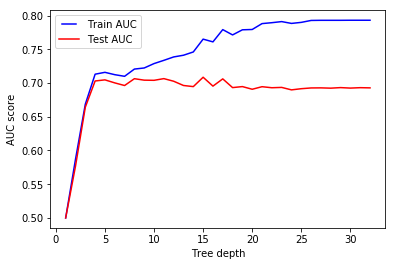

In [48]:
from matplotlib.legend_handler import HandlerLine2D

line1, = plt.plot(max_depths, train_results, 'b', label='Train AUC')
line2, = plt.plot(max_depths, test_results, 'r', label='Test AUC')
plt.legend(handler_map={line1: HandlerLine2D(numpoints=2)})
plt.ylabel('AUC score')
plt.xlabel('Tree depth')
plt.show()

The model overfits for large depth values, since it fails to generalise well for the test data at large depth. Therefore it is better to reduce complexity of the model by specifying max depth = 4

In [49]:
# Fitting a tree with max depth 4
treeclf = DecisionTreeClassifier(max_depth = 4, random_state=1)
treeclf.fit(X_train, y_train)

y_pred = treeclf.predict(X_test)
y_pred

# Compute the feature importances (the Gini index at each node).
pd.DataFrame({'feature':feats, 'importance':treeclf.feature_importances_})

false_positive_rate, true_positive_rate, thresholds = roc_curve(y_test, y_pred)
roc_auc = auc(false_positive_rate, true_positive_rate)
print('AUC:',roc_auc)


cv_scores = cross_val_score(treeclf, X, y, cv=10, scoring='accuracy')
msg = "Accuracy Score: %f (SD(Score):%f)" % (cv_scores.mean(), cv_scores.std())
print(msg)

AUC: 0.7029752107013022
Accuracy Score: 0.813869 (SD(Score):0.004039)


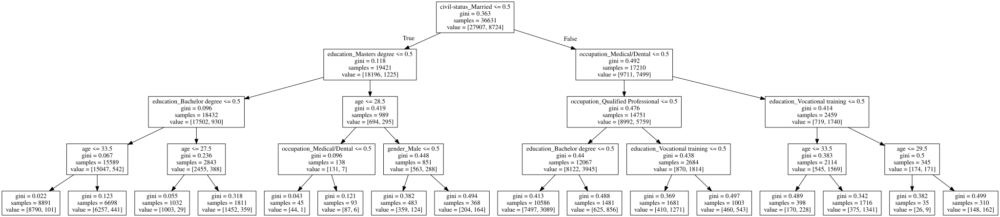

In [50]:
# Create a Graphviz visualisation
import graphviz 
from sklearn.tree import export_graphviz

treereg.fit(X_train, y_train)
dot_data = export_graphviz(treeclf, out_file=None, feature_names=feats)

graph = graphviz.Source(dot_data)  
graph 

In [51]:
from sklearn.metrics import accuracy_score, f1_score

print(accuracy_score(y_test, y_pred))
print(f1_score(y_test, y_pred, average='weighted'))

0.8150028662681189
0.8045478628533962


[sklearn.metrics.accuracy_score](http://scikit-learn.org/stable/modules/generated/sklearn.metrics.accuracy_score.html#sklearn.metrics.accuracy_score)

[sklearn.metrics.f1_score](http://scikit-learn.org/stable/modules/generated/sklearn.metrics.f1_score.html#sklearn.metrics.f1_score)

<a id="part-three"></a>
# Summary: Comparing Decision Trees With Other Models

**Advantages of decision trees:**

- They can be used for regression or classification.
- They can be displayed graphically.
- They are highly interpretable.
- They can be specified as a series of rules, and more closely approximate human decision-making than other models.
- Prediction is fast.
- Their features don't need scaling.
- They authomatically learn feature interactions.
- Tends to ignore irrelevant features.
- They are non-parametric (i.e. will outperform linear models if the relationship between features and response is highly non-linear).

![Trees versus linear models](assets/tree_vs_linear.png)

**Disadvantages of decision trees:**

- Their performance is (generally) not competitive with the best supervised learning methods.
- They can easily overfit the training data (tuning is required).
- Small variations in the data can result in a completely different tree (high variance).
- Recursive binary splitting makes "locally optimal" decisions that may not result in a globally optimal tree.
- They don't tend to work well if the classes are highly unbalanced.
- They don't tend to work well with very small data sets.